# (19) ca awake -- data

**Motivation**: Check out Ca awake data. Copy to raw folder, etc. <br>

In [1]:
# HIDE CODE


import os, sys
from IPython.display import display

# tmp & extras dir
git_dir = os.path.join(os.environ['HOME'], 'Dropbox/git')
extras_dir = os.path.join(git_dir, 'jb-Ca-fMRI/_extras')
fig_base_dir = os.path.join(git_dir, 'jb-Ca-fMRI/figs')
tmp_dir = os.path.join(git_dir, 'jb-Ca-fMRI/tmp')

# GitHub
sys.path.insert(0, os.path.join(git_dir, '_Ca-fMRI'))
from figures.fighelper import *
from analysis.final import *
from utils.render import *

# warnings, tqdm, & style
warnings.filterwarnings('ignore', category=DeprecationWarning)
from tqdm.notebook import tqdm
%matplotlib inline
set_style()

In [2]:
# HIDE CODE


def _invert_lr(img, arr=None):
    if arr is None:
        arr = img.numpy()
    return reset_ants_img(
        img=arr[:, ::-1],
        spacing=img.spacing,
        origin=img.origin,
        dtype=img.dtype,
        use_um=False,
    )


def _load_fx(sub: int, sharp_mask: bool = False):
    fx = f'sub-SLC{sub:02d}_ses-4_space-individual_desc-referenceimage_ca2.nii.gz'
    fx = ants.image_read(pjoin(mice.cfg.raw_dir, fx))
    fx = _invert_lr(fx)
    m_fx = f'sub-SLC{sub:02d}_ses-4_space-individual_desc-mask_ca2.nii.gz'
    m_fx = ants.image_read(pjoin(mice.cfg.raw_dir, m_fx))
    m_fx = _invert_lr(
        img=m_fx,
        arr=m_fx.numpy() == 1.0 if
        sharp_mask else m_fx.numpy()
    )
    return fx, m_fx


def _load_mv(sub: int, ses: int, sharp_mask: bool = False):
    mv = f'sub-SLC{sub:02d}_ses-{ses}_space-individual_desc-referenceimage_ca2.nii.gz'
    mv = ants.image_read(pjoin(mice.cfg.raw_dir, mv))
    mv = reset_ants_img(
        img=mv.numpy()[..., 0],
        spacing=mv.spacing[:2],
        origin=mv.origin[:2],
        dtype=mv.dtype,
        use_um=False,
    )
    m_mv = f'sub-SLC{sub:02d}_ses-{ses}_space-individual_desc-mask_ca2.nii.gz'
    m_mv = ants.image_read(pjoin(mice.cfg.raw_dir, m_mv))
    m_mv = reset_ants_img(
        img=rescale(
            m_mv.numpy() == 1.0 if
            sharp_mask else m_mv.numpy(), 2),
        spacing=mv.spacing,
        origin=mv.origin,
        dtype=mv.dtype,
        use_um=False,
    )
    return mv, m_mv


def _load_obj(sub: int, ses: int, obj: str = 'cols'):
    mv, _ = _load_mv(sub, ses)
    obj = f'sub-SLC{sub:02d}_ses-{ses}_space-indiv2d_{obj}.nii.gz'
    obj = ants.image_read(pjoin(mice.cfg.masks_dir, obj))
    obj = reset_ants_img(
        img=obj.numpy()[..., 0],
        spacing=mv.spacing,
        origin=mv.origin,
        dtype='uint32',
        use_um=False,
    )
    return obj


def _show_ref_overlay(x, mask, overlay, bound: int = 512):
    m = mask.numpy()
    x2p = filter_boundaries(x.numpy() * m, m)
    
    fig, axes = create_figure(1, 3, (7.8, 3.0), 'all', 'all', 'constrained')
    remove_ticks(axes)
    for ax in axes.flat:
        ax.imshow(x2p, cmap='Greys_r')

    axes[1].set_title('left hemis')
    axes[2].set_title('right hemis')

    x2p = filter_boundaries(overlay.numpy(), m)
    x2p = mwh(~np.logical_and(1 < x2p, x2p < bound), x2p)
    axes[1].imshow(x2p, cmap='Spectral', interpolation='none')

    x2p = filter_boundaries(overlay.numpy(), m)
    x2p = mwh(x2p < bound, x2p)
    axes[2].imshow(x2p, cmap='Spectral', interpolation='none')

    plt.show()


def _show_ref(sub):
    fx, m_fx = _load_fx(sub)

    fig, axes = create_figure(2, 2, (7, 7), 'all', 'all', 'constrained')
    ax = axes.flat[-1]
    ax.set_title("awake")
    x2p = mwh(~m_fx.numpy().astype(bool), fx.numpy())
    ax.imshow(x2p, cmap='Greys_r')

    for i in range(3):
        ax = axes.flat[i]
        ax.set_title(f"ses-{i+1}")
        mv, m_mv  = _load_mv(sub, i + 1)
        x2p = mwh(~m_mv.numpy().astype(bool), mv.numpy())
        ax.imshow(x2p, cmap='Greys_r')

    plt.show()



from register.register import reset_ants_img
from skimage.transform import rescale, resize

In [3]:
base_dir = '/mnt/storage/hadi/Ca-fMRI/ses-awake'
meta_dir = '/home/hadi/Documents/Ca-fMRI/meta_info'
raw_dir = '/mnt/storage/hadi/Ca-fMRI/raw'

## Explore (ref/funct)

In [4]:
path = 'animal55/ca2/SLC_animal55_ses-awake_2019-04-29_EPI2_REST'
path = pjoin(base_dir, path)

In [5]:
raw = pjoin(path, 'part-00', 'rawsignl.nii.gz')
raw = ants.image_read(raw).numpy()
raw.shape

(512, 500, 1, 2078)

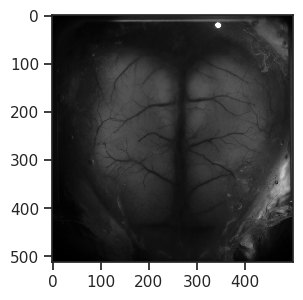

In [6]:
ref_img = raw[..., 0, raw.shape[-1] // 2]
plt.imshow(ref_img, cmap='Greys_r');

In [7]:
x = pjoin(path, 'signl_outLPS.nii.gz')
x = ants.image_read(x).numpy()
x.shape

(256, 250, 1, 5988)

In [8]:
sd = np.std(x[..., 0, :], -1)
mu = np.mean(x[..., 0, :], -1)
absmax = np.max(np.abs(mu))
if mu[mu == absmax]:
    pass
elif mu[mu == -absmax]:
    mu *= -1
else:
    raise RuntimeError(absmax)

tsnr = mu / sd

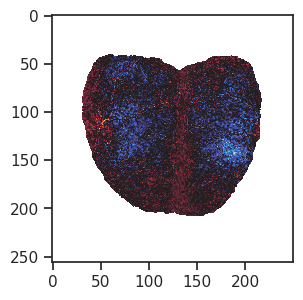

In [9]:
x2p = x[..., 0, 2880]
x2p = mwh(x2p == 0, x2p)
plt.imshow(x2p, cmap='icefire');

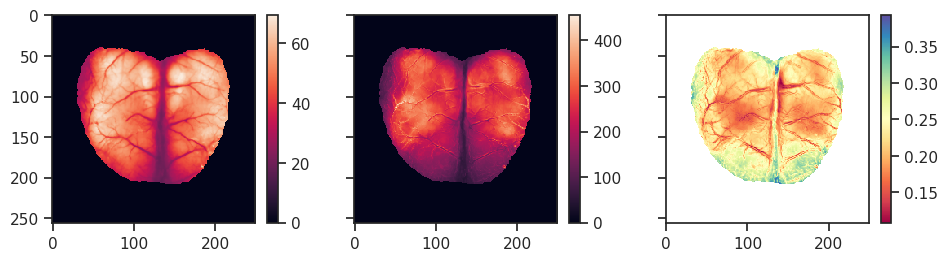

In [10]:
fig, axes = create_figure(1, 3, (9.5, 2.5), 'all', 'all', layout='constrained')
im = axes[0].imshow(mu)
plt.colorbar(im, ax=axes[0])
im = axes[1].imshow(sd)
plt.colorbar(im, ax=axes[1])
im = axes[2].imshow(tsnr, cmap='Spectral')
plt.colorbar(im, ax=axes[2])
plt.show()

## Explore

In [11]:
sorted(os.listdir(base_dir))

[
    'animal02',
    'animal06',
    'animal55',
    'animal56',
    'animal57',
    'animal73',
    'animal88',
    'animal89',
    'animal90'
]

In [12]:
multicell = pjoin(meta_dir, 'MultiCell.xlsx')
multicell = pd.read_excel(multicell, sheet_name=2)

In [13]:
multicell[:40]

,Bruker filenames,Unnamed: 1,data16/multi_cell/ (or ca2data/),Unnamed: 3,Unnamed: 4,data24/multi_cell3/,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,...,Unnamed: 28,Unnamed: 29,Unnamed: 30,Unnamed: 31,Unnamed: 32,Unnamed: 33,Unnamed: 34,Unnamed: 35,Unnamed: 36,Unnamed: 37
0,"SLC – session 1, N=10",Final_ID (data24/),fMRI_ID,calcium_ID,checked_transforms,fMRI_ID,calcium_ID,checked_transforms,redo_preproc (w_gsr),*funconn.matr,...,Convert,AngioMask,Project,Motion BIS,"""Mean"" fMRI",AnatSkullStrip,fmri_reslice_to_anat,Anat2Conv,Conv2fMRI,Angio2Anat
1,20190109_095315_2019_01_09_tiger1_01_black_1_1,BIS_output_SLC01-01,BIS_output_SLC01-01,animal01,to check angio2optical,BIS_output_SLC01-01,animal01,all - FM,x,x,...,X,X,X,X,X,x - FM,x - FM,X - EL,X - EL,X - EL
2,20190109_125959_2018_01_09_tiger1_02_blackNoTa...,BIS_output_SLC06-01,BIS_output_SLC02-01,animal02,all - FM,BIS_output_SLC06-01,animal02,all - FM,x,x,...,X,X,X,X,X,x - FM,x - FM,X - EL,X - EL,Replace with up-sampled angio.
3,20190109_162654_2019_01_09_tiger1_03_yellow_1_1,BIS_output_SLC04-01,BIS_output_SLC03-01,animal03,all - FM,BIS_output_SLC04-01,animal03,all - FM,x,x,...,X,X,X,X,X,x - FM,x - FM,X - EL,X - EL,X - EL
4,20190110_095857_2019_01_10_tiger1_04_yellowNoT...,BIS_output_SLC03-01,BIS_output_SLC04-01,animal04,all - FM,BIS_output_SLC03-01,animal04,all - FM,x,x,...,X,X,X,X,X,x - FM,x - FM,X - EL,X - EL,X - EL
5,20190110_125836_2019_01_10_tiger1_05_yellow_1_...,BIS_output_SLC05-01,BIS_output_SLC05-01,animal05,all - FM,BIS_output_SLC05-01,animal05,all - FM,x,x,...,X,X,X,X,X,x - FM,x - FM,X - EL,X - EL,X - EL
6,20190110_162209_2019_01_10_tiger1_06_black_1_1,BIS_output_SLC02-01,BIS_output_SLC06-01,animal06,all - FM,BIS_output_SLC02-01,animal06,all - FM,x,x,...,X,X,X,X,X,x - FM,x - FM,X - EL,X - EL,X - EL
7,20190321_083520_2019_03_21_TIGRE1_mouse55_1_1,BIS_output_SLC07-01,BIS_output_SLC07-01,animal55,Adjusted Angio2Anat,BIS_output_SLC07-01,animal55,copied_old,copied_old,x,...,X,X,X,X,X,x - FM,x - FM,X - EL,X - EL,X - EL
8,20190321_114003_2019_03_21_TIGRE1_mouse57_1_1,BIS_output_SLC08-01,BIS_output_SLC08-01,animal57,all - EL,BIS_output_SLC08-01,animal57,copied_old,copied_old,x,...,X,X,X,X,X,x - FM,x - FM,X - EL,X - EL,X - EL
9,20190321_144347_2019_03_21_TIGRE1_mouse56_1_1,BIS_output_SLC09-01,BIS_output_SLC09-01,animal56,all - EL,BIS_output_SLC09-01,animal56,copied_old,copied_old,x,...,X,X,X,X,X,x - FM,x - FM,X - EL,X - EL,X - EL


In [15]:
dictionary = sorted([
    (a, b) for a, b in
    zip(multicell['data24/multi_cell3/'], multicell['Unnamed: 6'])
    if isinstance(a, str) and 'BIS' in a and isinstance(b, str) and 'animal' in b
])
dictionary

[
    ('BIS_output_SLC01-01', 'animal01'),
    ('BIS_output_SLC01-02', 'animal01'),
    ('BIS_output_SLC01-03', 'animal01'),
    ('BIS_output_SLC02-01', 'animal06'),
    ('BIS_output_SLC02-02', 'animal06'),
    ('BIS_output_SLC02-03', 'animal06'),
    ('BIS_output_SLC03-01', 'animal04'),
    ('BIS_output_SLC03-02', 'animal04'),
    ('BIS_output_SLC03-03', 'animal04'),
    ('BIS_output_SLC04-01', 'animal03'),
    ('BIS_output_SLC04-02', 'animal03'),
    ('BIS_output_SLC04-03', 'animal03'),
    ('BIS_output_SLC05-01', 'animal05'),
    ('BIS_output_SLC05-02', 'animal05'),
    ('BIS_output_SLC05-03', 'animal05'),
    ('BIS_output_SLC06-01', 'animal02'),
    ('BIS_output_SLC06-02', 'animal02'),
    ('BIS_output_SLC06-03', 'animal02'),
    ('BIS_output_SLC07-01', 'animal55'),
    ('BIS_output_SLC07-02', 'animal55'),
    ('BIS_output_SLC07-03', 'animal55'),
    ('BIS_output_SLC08-01', 'animal57'),
    ('BIS_output_SLC08-02', 'animal57'),
    ('BIS_output_SLC08-03', 'animal57'),
    ('BIS_output_SLC09-01', 'animal56'),
    ('BIS_output_SLC09-02', 'animal56'),
    ('BIS_output_SLC09-03', 'animal56'),
    ('BIS_output_SLC10-01', 'animal73'),
    ('BIS_output_SLC10-02', 'animal58'),
    ('BIS_output_SLC10-03', 'animal73'),
    ('BIS_output_SLC11-01', 'animal88'),
    ('BIS_output_SLC12-01', 'animal89'),
    ('BIS_output_SLC13-01', 'animal90')
]

In [17]:
anim2slc = collections.defaultdict(list)
for a, b in dictionary:
    anim2slc[b].append(a.split('_')[-1].split('-')[0])
assert all(len(set(v)) == 1 for v in anim2slc.values())
anim2slc = {a: set(b).pop() for a, b in anim2slc.items()}
anim2slc = dict(sorted(anim2slc.items()))
anim2slc

{
    'animal01': 'SLC01',
    'animal02': 'SLC06',
    'animal03': 'SLC04',
    'animal04': 'SLC03',
    'animal05': 'SLC05',
    'animal06': 'SLC02',
    'animal55': 'SLC07',
    'animal56': 'SLC09',
    'animal57': 'SLC08',
    'animal58': 'SLC10',
    'animal73': 'SLC10',
    'animal88': 'SLC11',
    'animal89': 'SLC12',
    'animal90': 'SLC13'
}

In [18]:
_ = save_obj(
    obj=anim2slc,
    file_name='anim2slc',
    save_dir=meta_dir,
    verbose=True,
    mode='npy',
)

[PROGRESS] 'anim2slc.npy' saved at
/home/hadi/Documents/Ca-fMRI/meta_info

## Choose ref img for each animal (from which run?)

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

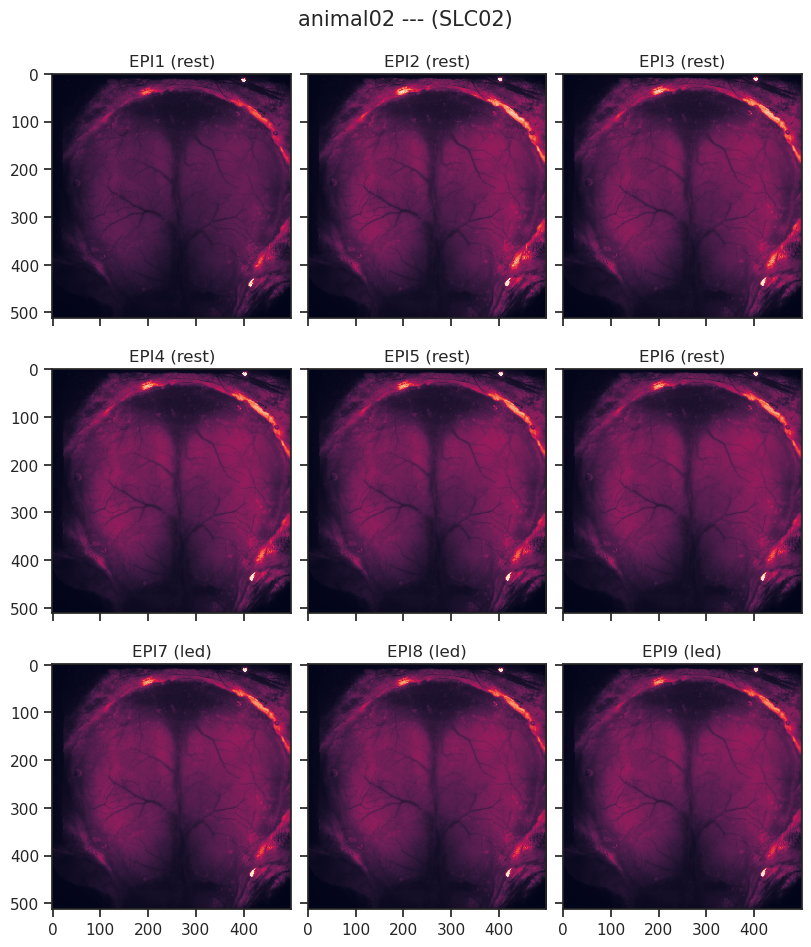

  0%|          | 0/9 [00:00<?, ?it/s]

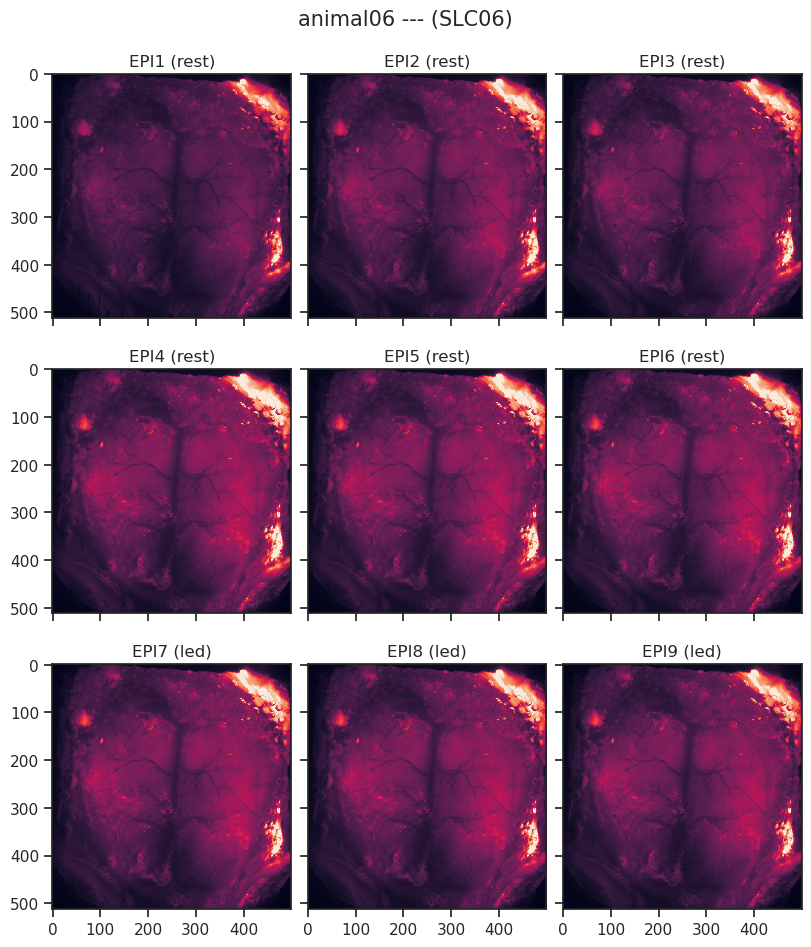

  0%|          | 0/9 [00:00<?, ?it/s]

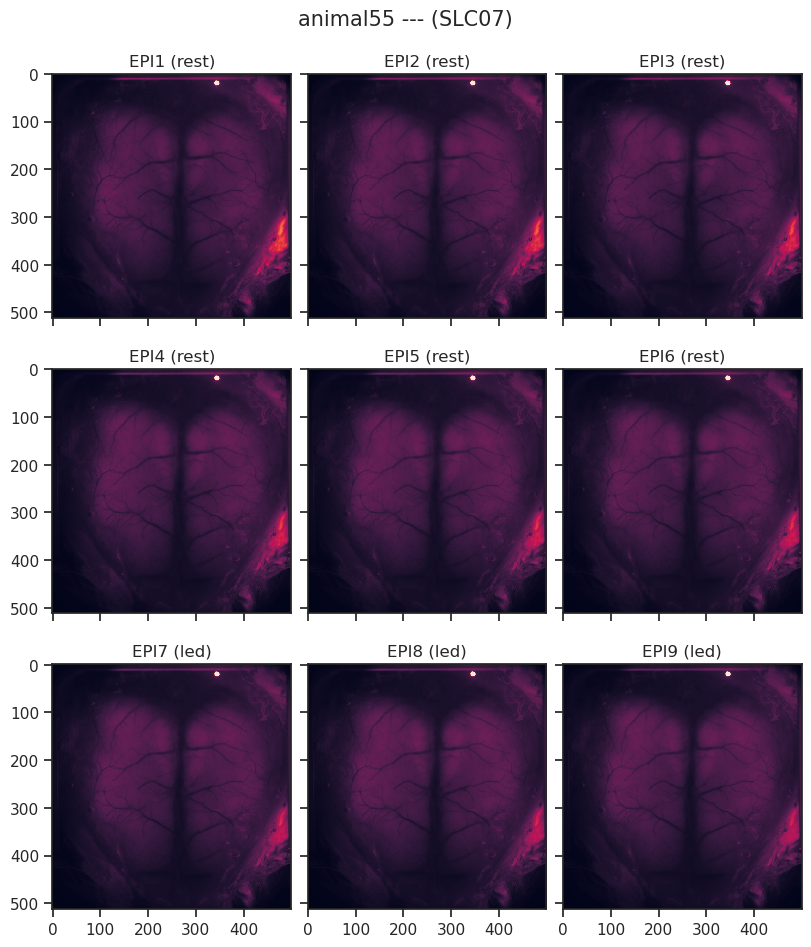

  0%|          | 0/10 [00:00<?, ?it/s]

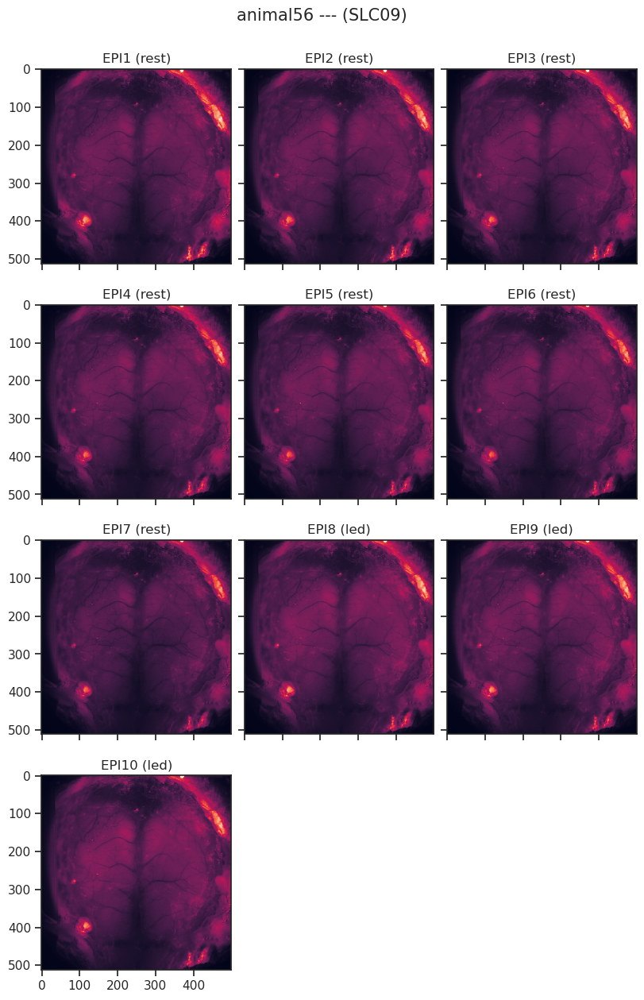

  0%|          | 0/9 [00:00<?, ?it/s]

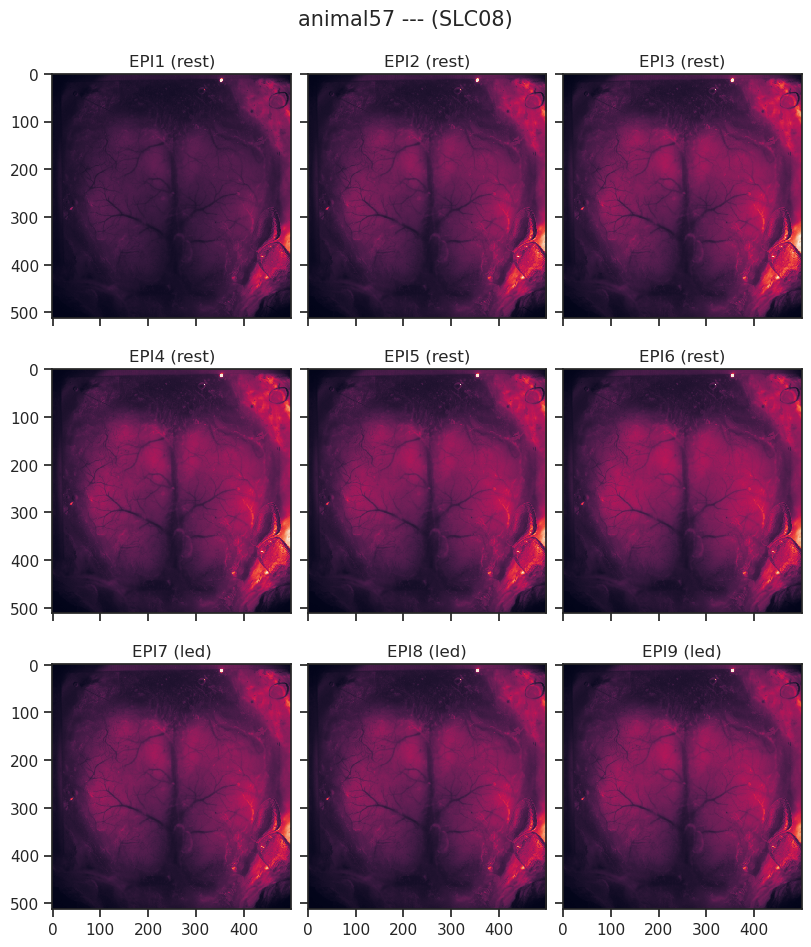

  0%|          | 0/9 [00:00<?, ?it/s]

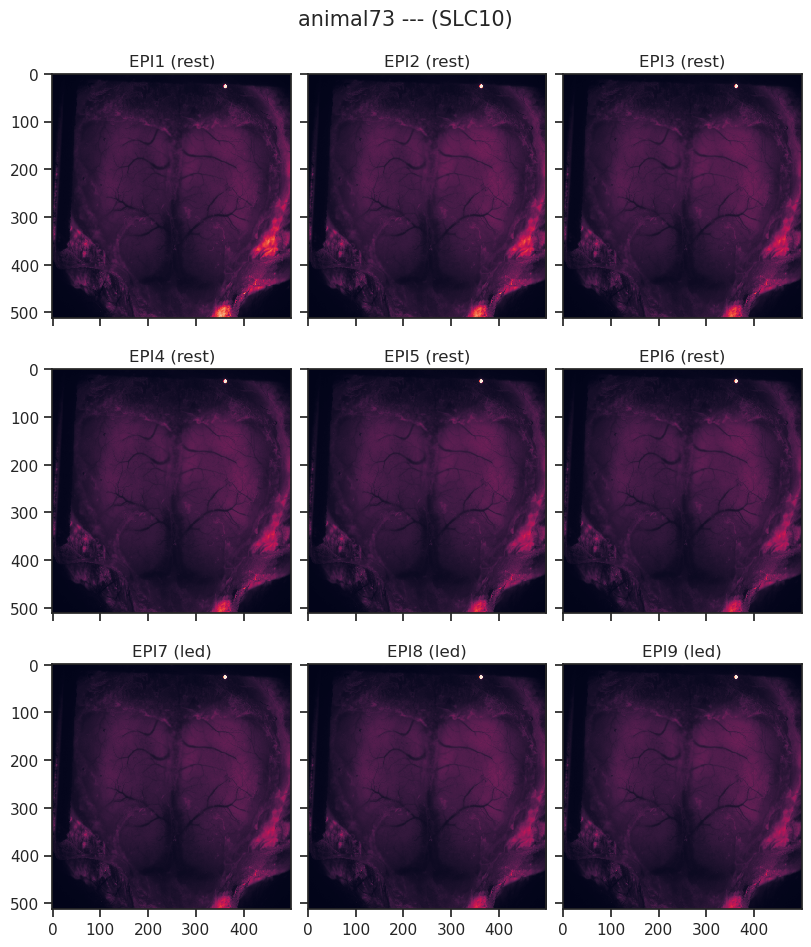

  0%|          | 0/10 [00:00<?, ?it/s]

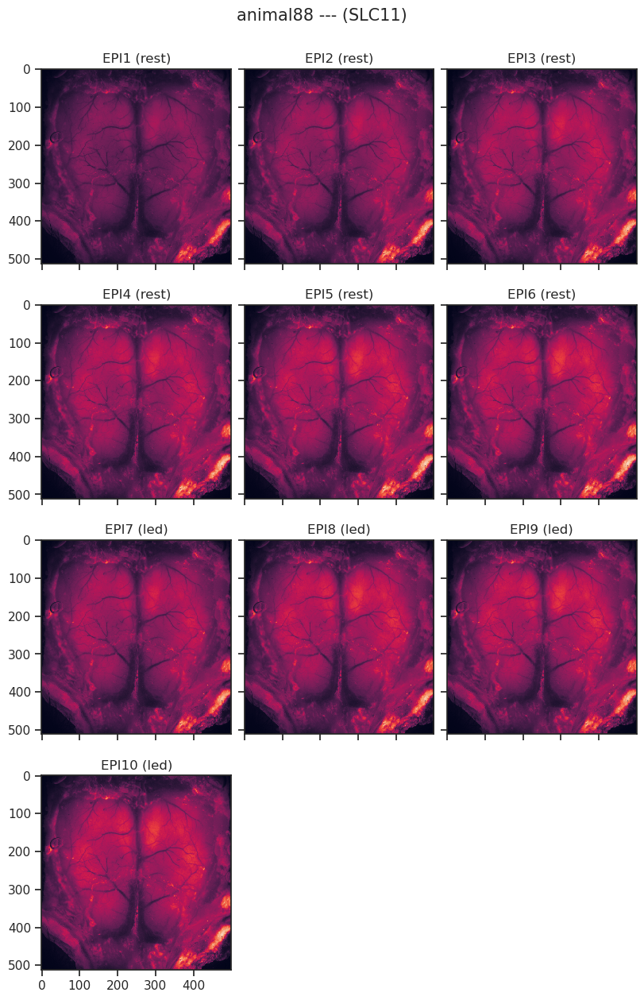

  0%|          | 0/9 [00:00<?, ?it/s]

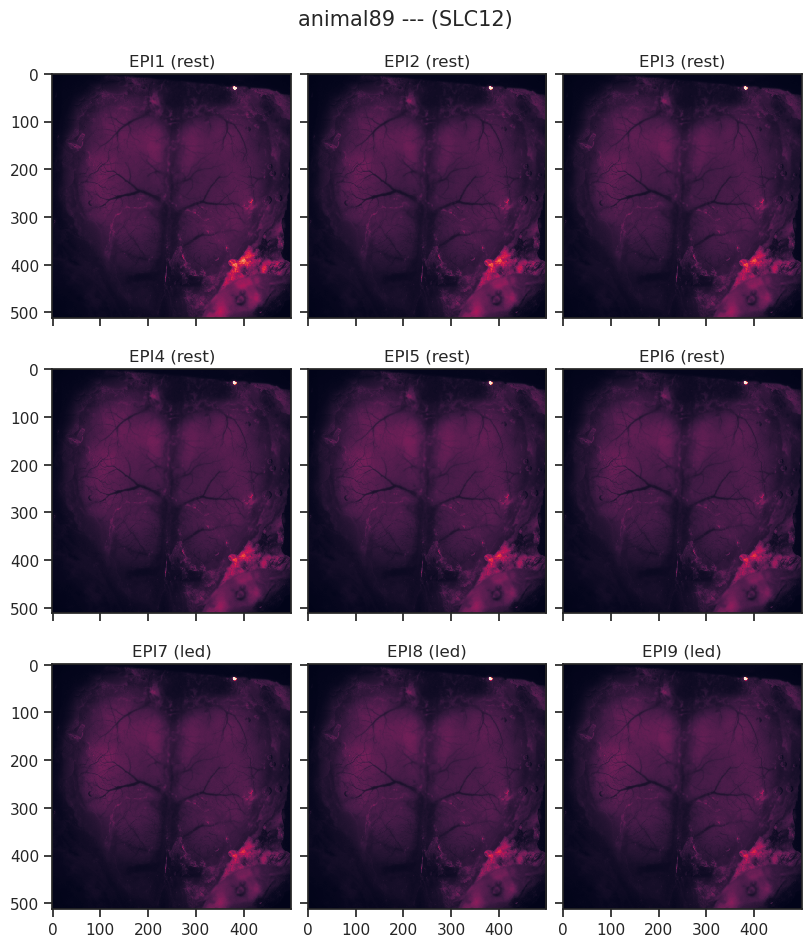

  0%|          | 0/9 [00:00<?, ?it/s]

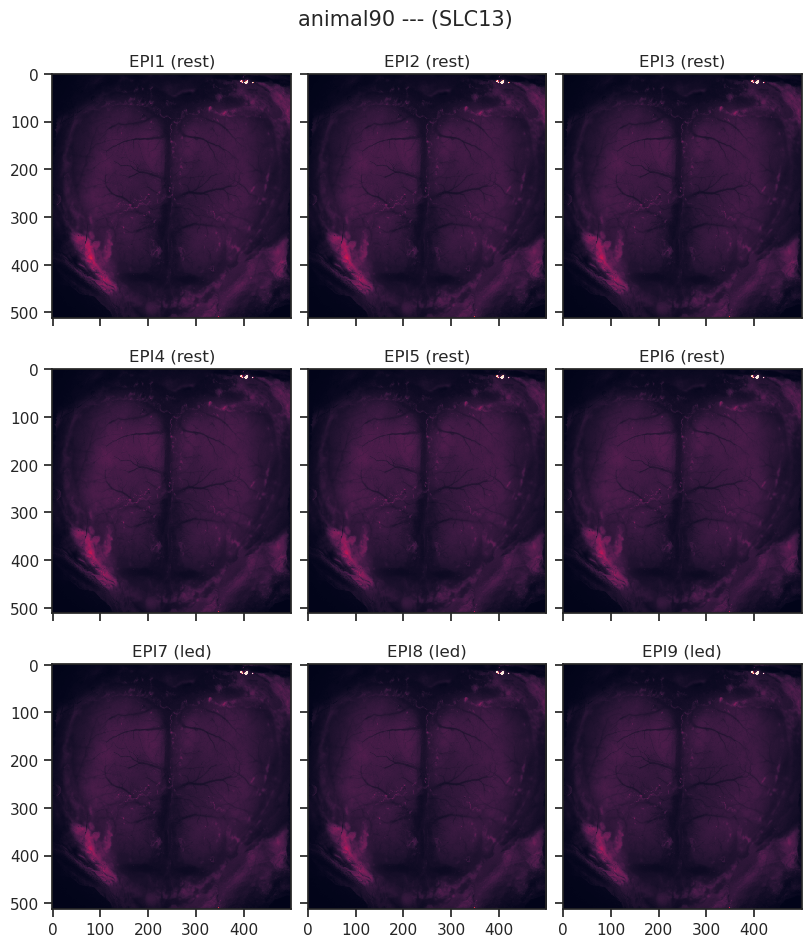

In [157]:
for anim in tqdm(sorted(os.listdir(base_dir))):
    anim_path = pjoin(base_dir, anim, 'ca2')
    runs = sorted(os.listdir(anim_path))
    nrows = int(np.ceil(len(runs) / 3))
    fig, axes = create_figure(
        nrows, 3, (8, 3 * nrows),
        'all', 'all',
        'constrained',
    )
    for run_str in tqdm(runs, total=len(runs), leave=False):
        run_path = pjoin(anim_path, run_str)
        task = run_str.split('_')[-1].lower()
        run_i = int(re.findall(r'\d+', run_str.split('_')[-2]).pop())

        # load raw & exctract ref img
        raw = pjoin(run_path, 'part-00', 'rawsignl.nii.gz')
        raw = ants.image_read(raw).numpy()
        ref_img = raw[..., 0, raw.shape[-1] // 2]
        
        # plot
        ax = axes.flat[run_i - 1]
        ax.imshow(ref_img)
        ax.set_title(f"EPI{run_i} ({task})")
        
    fig.suptitle(f"{anim} --- ({anim2slc[anim]})", y=1.04, fontsize=15)
    trim_axs(axes, len(runs))
    plt.show()

## Save functional + ref data

In [4]:
from register.register import reset_ants_img
from skimage.transform import rescale, resize
anim2slc = np.load(pjoin(meta_dir, 'anim2slc.npy'), allow_pickle=True).item()
anim2slc

{
    'animal01': 'SLC01',
    'animal02': 'SLC06',
    'animal03': 'SLC04',
    'animal04': 'SLC03',
    'animal05': 'SLC05',
    'animal06': 'SLC02',
    'animal55': 'SLC07',
    'animal56': 'SLC09',
    'animal57': 'SLC08',
    'animal58': 'SLC10',
    'animal73': 'SLC10',
    'animal88': 'SLC11',
    'animal89': 'SLC12',
    'animal90': 'SLC13'
}

In [5]:
%%time


ses = 4
for anim in sorted(os.listdir(base_dir)):
    anim_path = pjoin(base_dir, anim, 'ca2')
    for run_str in sorted(os.listdir(anim_path)):
        run_path = pjoin(anim_path, run_str)
        task = run_str.split('_')[-1].lower()
        run_i = int(re.findall(r'\d+', run_str.split('_')[-2]).pop())
        
        # copy functional data (LPS)
        name = '_'.join([
            f"sub-{anim2slc[anim]}",
            f"ses-{ses}",
            f"task-{task}",
            f"run-{run_i}",
            'space-individual',
            'desc-awake',
            'ca2',
        ])
        name = f"{name}.nii.gz"
        try:
            shutil.copy(
                src=pjoin(run_path, 'signl_outLPS.nii.gz'),
                dst=pjoin(raw_dir, name),
            )
        except FileNotFoundError:
            print(f"Warning! run missing:\n{name}")
            continue

        # load raw & exctract ref img
        if run_i == 5:
            raw = pjoin(run_path, 'part-00', 'rawsignl.nii.gz')
            raw = ants.image_read(raw)
            ref_img = raw.numpy()[..., 0, raw.shape[-1] // 2]
            ref_img = reset_ants_img(
                img=ref_img,
                spacing=raw.spacing[:2],
                origin=raw.origin[:2],
                dtype=raw.dtype,
                use_um=False,
            )
            name = '_'.join([
                f"sub-{anim2slc[anim]}",
                f"ses-{ses}",
                'space-individual',
                'desc-referenceimage',
                'ca2',
            ])
            name = f"{name}.nii.gz"
            ants.image_write(ref_img, pjoin(raw_dir, name))

            # save mask
            x = ants.image_read(pjoin(run_path, 'signl_outLPS.nii.gz'))
            m = np.mean(np.abs(x.numpy()), -1)[..., 0] > 0
            m = reset_ants_img(
                img=rescale(m, 2),
                spacing=[i / 2 for i in x.spacing[:2]],
                use_um=False,
                dtype=float,
            )
            name = '_'.join([
                f"sub-{anim2slc[anim]}",
                f"ses-{ses}",
                'space-individual',
                'desc-mask',
                'ca2',
            ])
            name = f"{name}.nii.gz"
            ants.image_write(m, pjoin(raw_dir, name))

Warning! run missing:
sub-SLC08_ses-4_task-rest_run-1_space-individual_desc-awake_ca2.nii.gz

Warning! run missing:
sub-SLC08_ses-4_task-rest_run-2_space-individual_desc-awake_ca2.nii.gz

Warning! run missing:
sub-SLC08_ses-4_task-rest_run-3_space-individual_desc-awake_ca2.nii.gz

Warning! run missing:
sub-SLC08_ses-4_task-rest_run-4_space-individual_desc-awake_ca2.nii.gz

Warning! run missing:
sub-SLC08_ses-4_task-rest_run-5_space-individual_desc-awake_ca2.nii.gz

Warning! run missing:
sub-SLC08_ses-4_task-rest_run-6_space-individual_desc-awake_ca2.nii.gz

Warning! run missing:
sub-SLC08_ses-4_task-led_run-7_space-individual_desc-awake_ca2.nii.gz

Warning! run missing:
sub-SLC08_ses-4_task-led_run-8_space-individual_desc-awake_ca2.nii.gz

Warning! run missing:
sub-SLC08_ses-4_task-led_run-9_space-individual_desc-awake_ca2.nii.gz

CPU times: user 5min 15s, sys: 3min 39s, total: 8min 54s
Wall time: 14min 52s


## Verify if ref images look alright

In [4]:
mice = Mice(512)
subs = [2, 6, 7, 9, 10]

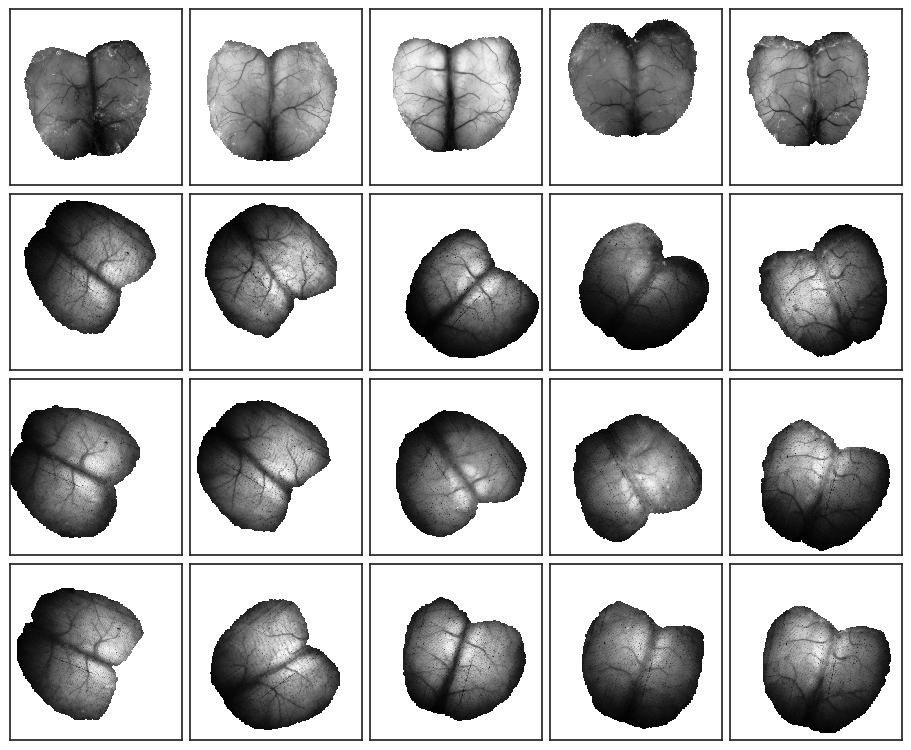

In [5]:
fig, axes = create_figure(4, len(subs), (9, 7.4), layout='constrained')
for i in range(4):
    for j, sub in enumerate(subs):
        if i == 0:
            x, m = _load_fx(sub)
        else:
            x, m = _load_mv(sub, i)
        ax = axes[i, j]
        x2p = mwh(m.numpy() == 0, x.numpy())
        ax.imshow(x2p, cmap='Greys_r')
remove_ticks(axes, False)
plt.show()

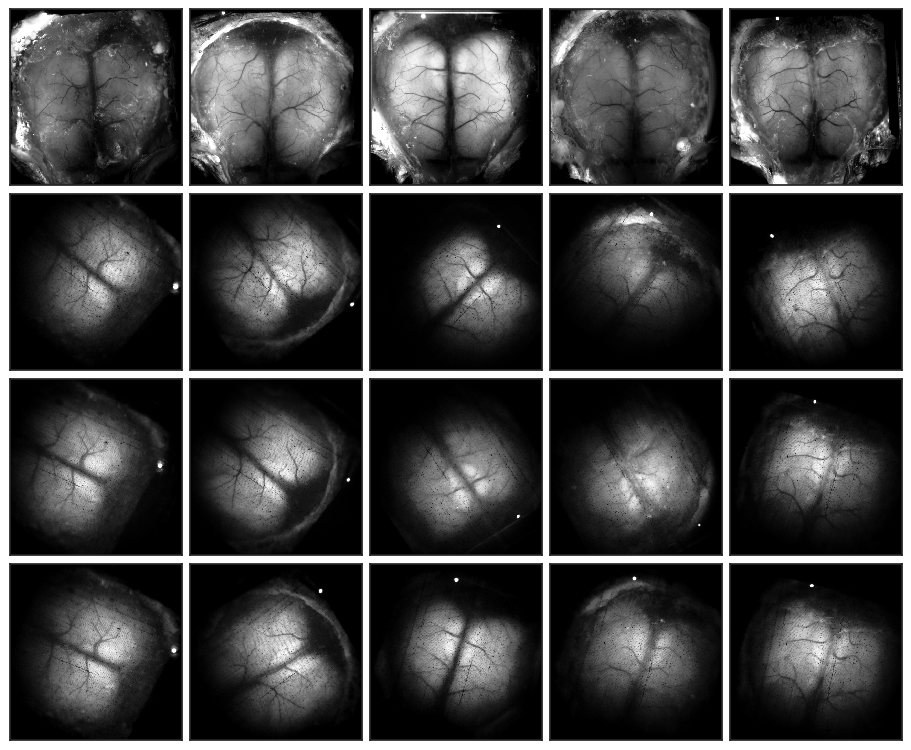

In [6]:
fig, axes = create_figure(4, len(subs), (9, 7.4), layout='constrained')
for i in range(4):
    for j, sub in enumerate(subs):
        if i == 0:
            x, m = _load_fx(sub)
        else:
            x, m = _load_mv(sub, i)
        x = x.numpy()
        m = m.numpy()
        vmin = np.nanmin(x[m > 0])
        vmax = np.nanmax(x[m > 0])
        ax = axes[i, j]
        ax.imshow(x, vmin=vmin, vmax=vmax, cmap='Greys_r')
remove_ticks(axes, False)
plt.show()

## Older plots

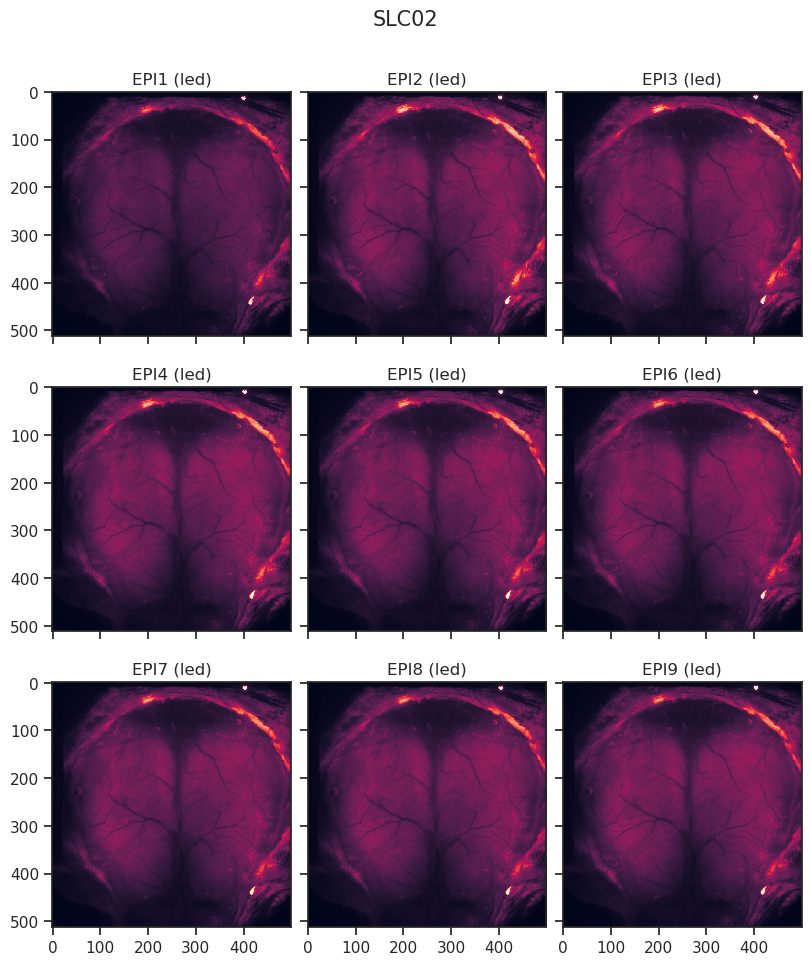

In [148]:
fig, axes = create_figure(3, 3, (8, 9), 'all', 'all', 'constrained')
for i in range(9):
    ax = axes.flat[i]
    ax.imshow(ref_imgs[i + 1])
    ax.set_title(f"EPI{i + 1} ({task})")
fig.suptitle(anim2slc[anim], y=1.06, fontsize=15)
plt.show()

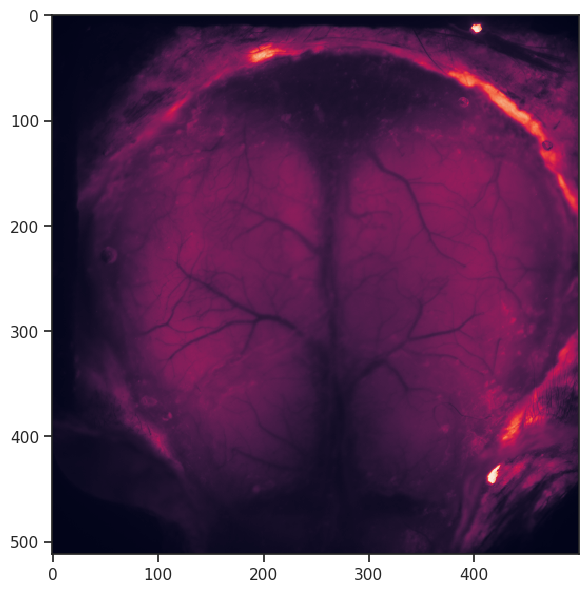

In [142]:
fig, ax = create_figure(1, 1, (7, 7))
ax.imshow(np.stack(list(ref_imgs.values())).mean(0));

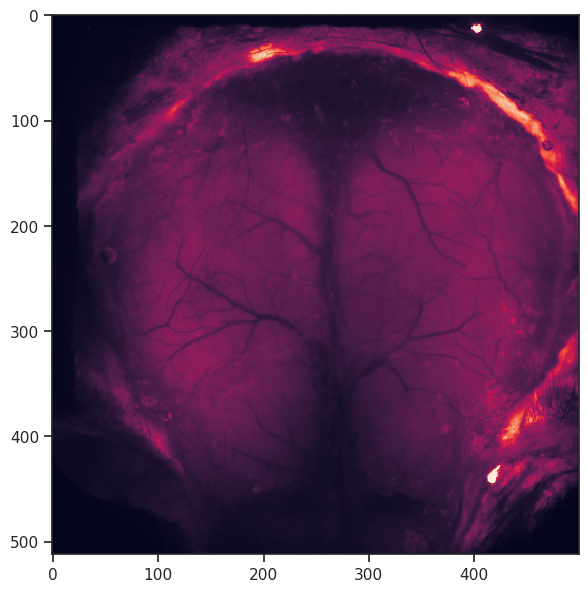

In [141]:
fig, ax = create_figure(1, 1, (7, 7))
ax.imshow(ref_imgs[3]);